In [2]:
import os
import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image
import cripser as cr
from gudhi.representations import Landscape
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import UnidentifiedImageError
import seaborn as sns
from collections import Counter
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms

https://github.com/luangtatipsy/intel-image-classification/blob/master/101_result_analysis.ipynb

In [3]:
def dataloader(directory):
    records = []
    for class_path in sorted([d for d in directory.iterdir() if d.is_dir()]):
        for image_path in class_path.glob("*.jpg"):
            records.append({"image": str(image_path), "class": class_path.name})
    return pd.DataFrame(records)

In [4]:
train_dir = Path("../data/seg_train/seg_train")
train_df = dataloader(train_dir)

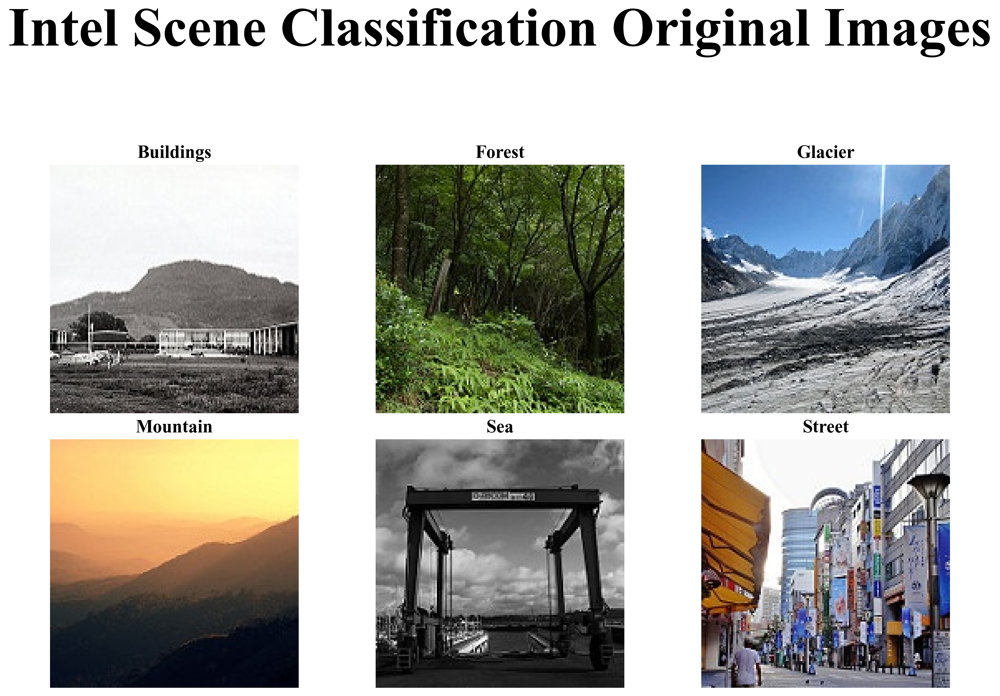

In [5]:
import matplotlib.pyplot as plt
from PIL import Image

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle("Intel Scene Classification Original Images", 
             fontsize=48, fontweight='bold', fontname='Times New Roman', color='black', y=1.05)
fig.set_dpi(300)
fig.patch.set_alpha(0)

for ax, class_name in zip(axes.flat, sorted(train_df["class"].unique())[:6]):
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(class_name.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})
    ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Data Exploration

In [6]:
def check_corrupt_images(df):
    corrupt_paths = []
    for path in df["image"]:
        try:
            with Image.open(path) as img:
                img.verify()
        except (UnidentifiedImageError, IOError, OSError):
            corrupt_paths.append(path)
    return corrupt_paths

corrupt_imgs = check_corrupt_images(train_df)
print("Corrupt images:", corrupt_imgs)

Corrupt images: []


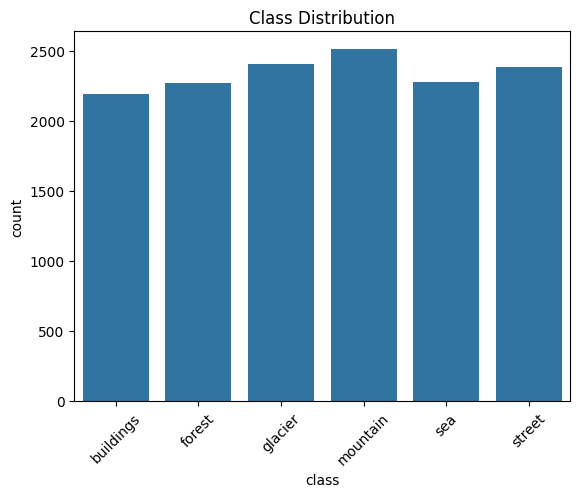

In [7]:
sns.countplot(data=train_df, x="class")
plt.title("Class Distribution")
plt.xticks(rotation=45)
plt.show()

In [8]:
image_stds = []

for idx, row in train_df.iterrows():
    img = Image.open(row["image"]).convert("L")
    std_val = np.std(np.array(img))
    image_stds.append(std_val)

train_df["std"] = image_stds

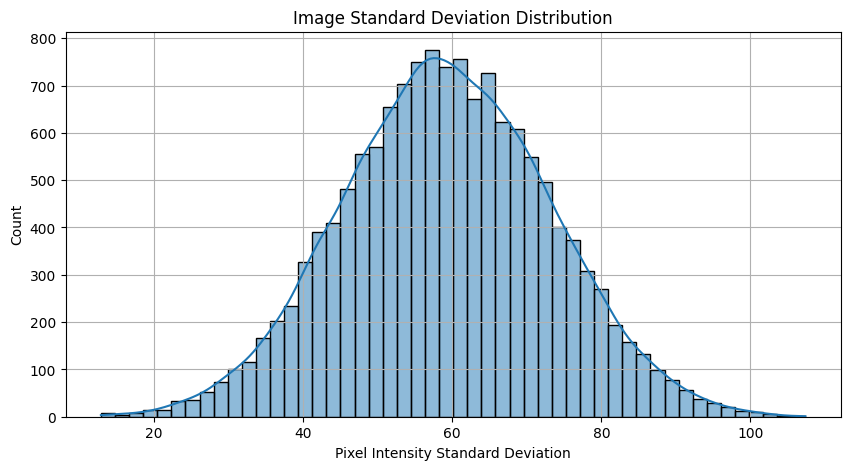

In [9]:
plt.figure(figsize=(10, 5))
sns.histplot(train_df["std"], bins=50, kde=True)
plt.title("Image Standard Deviation Distribution")
plt.xlabel("Pixel Intensity Standard Deviation")
plt.ylabel("Count")
plt.grid(True)
plt.show()

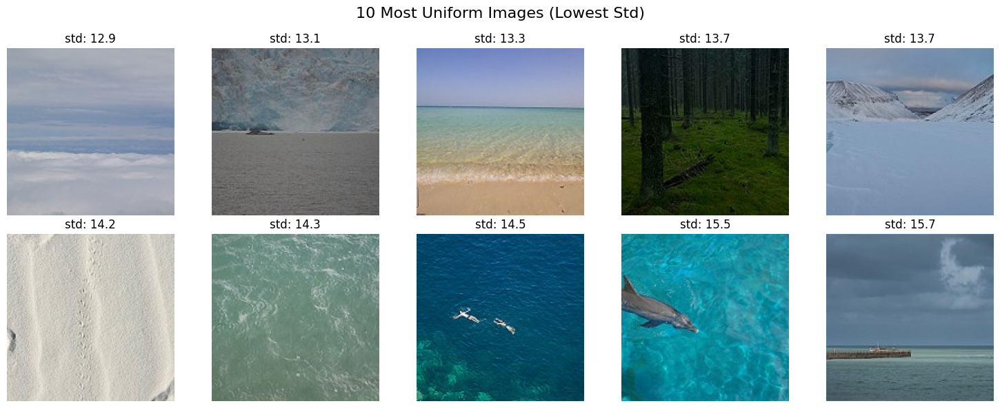

In [10]:
lowest_std_df = train_df.sort_values("std").head(10)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for ax, (_, row) in zip(axes.flat, lowest_std_df.iterrows()):
    img = Image.open(row["image"])
    ax.imshow(img)
    ax.set_title(f"std: {row['std']:.1f}")
    ax.axis("off")

plt.suptitle("10 Most Uniform Images (Lowest Std)", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()

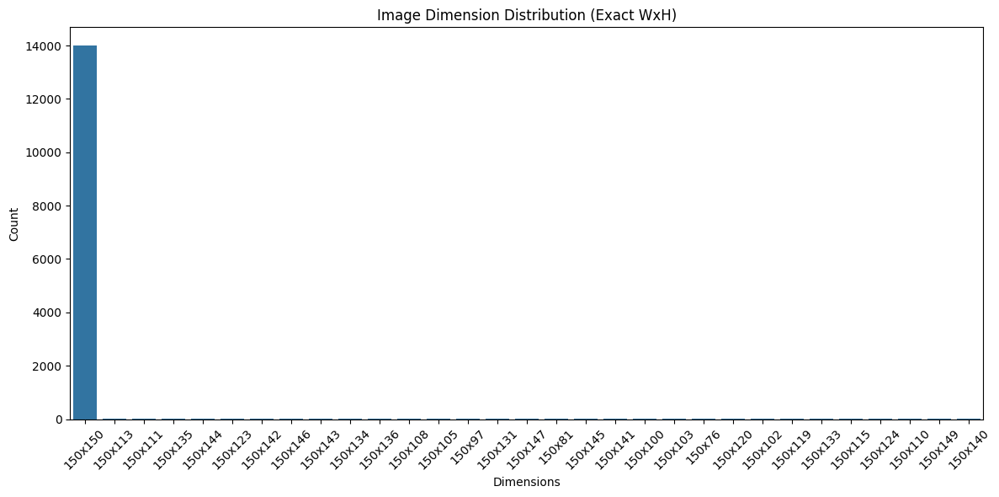

In [11]:
train_df["dimensions"] = train_df["image"].apply(lambda x: f"{Image.open(x).size[0]}x{Image.open(x).size[1]}")

dimension_counts = train_df["dimensions"].value_counts().reset_index()
dimension_counts.columns = ["dimensions", "count"]

plt.figure(figsize=(12, 6))
sns.barplot(data=dimension_counts, x="dimensions", y="count")
plt.title("Image Dimension Distribution (Exact WxH)")
plt.xlabel("Dimensions")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [12]:
train_df["size"] = train_df["image"].apply(lambda x: Image.open(x).size)

train_df = train_df[train_df["size"] == (150, 150)].reset_index(drop=True)

print(f"Filtered dataset size: {train_df.shape}")

Filtered dataset size: (13986, 5)


Processing class: buildings...


Finished processing class: buildings
Processing class: forest...


Finished processing class: forest
Processing class: glacier...


Finished processing class: glacier
Processing class: mountain...


Finished processing class: mountain
Processing class: sea...


Finished processing class: sea
Processing class: street...


Finished processing class: street


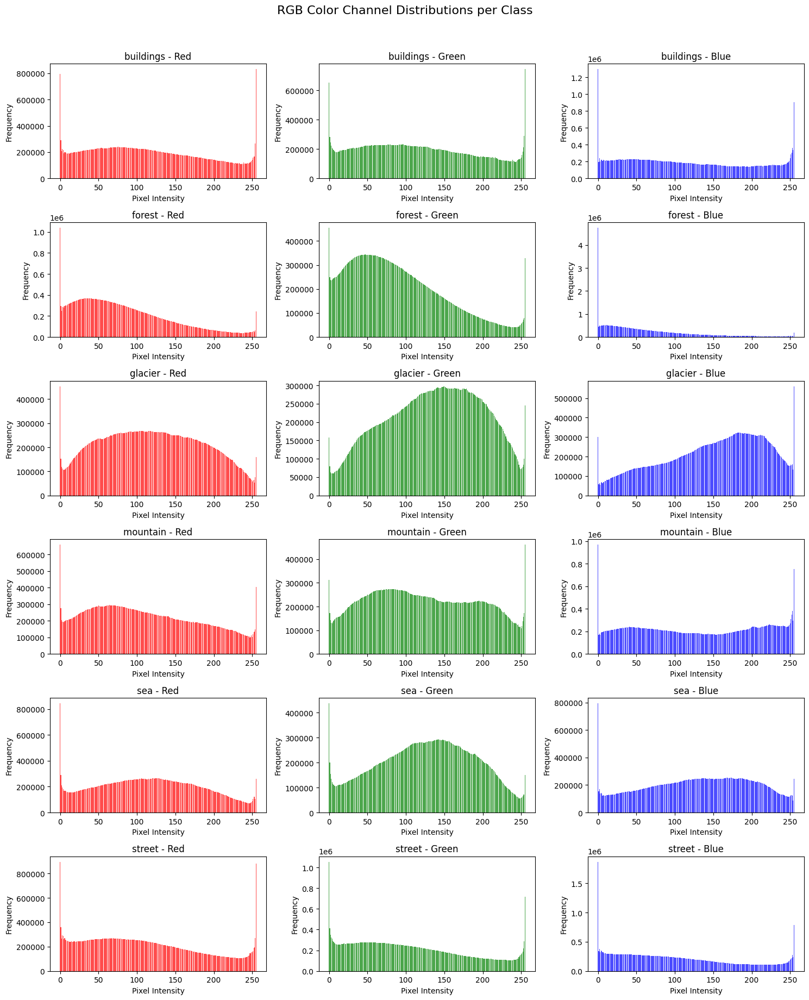

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm import tqdm

classes = sorted(train_df["class"].unique())
n_classes = len(classes)

fig, axes = plt.subplots(n_classes, 3, figsize=(15, n_classes * 3))
fig.suptitle("RGB Color Channel Distributions per Class", fontsize=16, y=1.02)

for i, class_name in enumerate(classes):
    print(f"Processing class: {class_name}...")
    
    red_hist = np.zeros(256, dtype=np.int64)
    green_hist = np.zeros(256, dtype=np.int64)
    blue_hist = np.zeros(256, dtype=np.int64)
    
    class_images = train_df[train_df["class"] == class_name]["image"].tolist()
    
    for img_path in tqdm(class_images, desc=f"{class_name} images", leave=False):
        try:
            img = Image.open(img_path).convert('RGB') 
            np_img = np.array(img)
            
            hist_r, _ = np.histogram(np_img[:, :, 0], bins=256, range=(0, 255))
            hist_g, _ = np.histogram(np_img[:, :, 1], bins=256, range=(0, 255))
            hist_b, _ = np.histogram(np_img[:, :, 2], bins=256, range=(0, 255))
            
            red_hist += hist_r
            green_hist += hist_g
            blue_hist += hist_b
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
    
    for j, (hist, color) in enumerate(zip([red_hist, green_hist, blue_hist], ['Red', 'Green', 'Blue'])):
        ax = axes[i, j] if n_classes > 1 else axes[j]
        ax.bar(range(256), hist, color=color.lower(), alpha=0.7)
        ax.set_title(f"{class_name} - {color}")
        ax.set_xlabel("Pixel Intensity")
        ax.set_ylabel("Frequency")
    
    print(f"Finished processing class: {class_name}")

plt.tight_layout()
plt.show()

Processing all images: 100%|████████████████████████████████████████████████████| 13986/13986 [00:15<00:00, 903.50it/s]


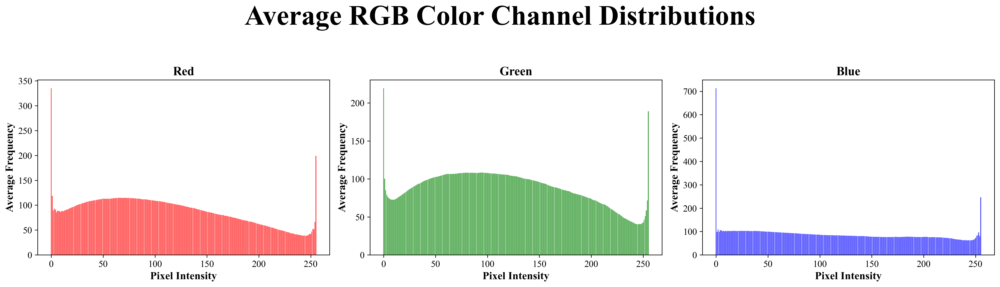

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm import tqdm

plt.rcParams['font.family'] = 'Times New Roman'

all_images = train_df["image"].tolist()
n_images = len(all_images)

red_hist = np.zeros(256, dtype=np.float64)
green_hist = np.zeros(256, dtype=np.float64)
blue_hist = np.zeros(256, dtype=np.float64)

for img_path in tqdm(all_images, desc="Processing all images"):
    try:
        img = Image.open(img_path).convert('RGB')  
        np_img = np.array(img)
        
        hist_r, _ = np.histogram(np_img[:, :, 0], bins=256, range=(0, 255))
        hist_g, _ = np.histogram(np_img[:, :, 1], bins=256, range=(0, 255))
        hist_b, _ = np.histogram(np_img[:, :, 2], bins=256, range=(0, 255))
        
        red_hist += hist_r
        green_hist += hist_g
        blue_hist += hist_b
    except Exception as e:
        print(f"Error processing {img_path}: {e}")

red_hist /= n_images
green_hist /= n_images
blue_hist /= n_images

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.set_dpi(300)
fig.patch.set_alpha(0)  
fig.suptitle("Average RGB Color Channel Distributions", fontsize=36, fontweight='bold', color='black', y=1.02)

channels = ["Red", "Green", "Blue"]
colors = ["red", "green", "blue"]
hists = [red_hist, green_hist, blue_hist]

for ax, channel, color, hist in zip(axes, channels, colors, hists):
    ax.bar(range(256), hist, color=color, alpha=0.7)
    ax.set_title(channel, fontsize=16, fontweight='bold', color='black')
    ax.set_xlabel("Pixel Intensity", fontsize=14, fontweight='bold', color='black')
    ax.set_ylabel("Average Frequency", fontsize=14, fontweight='bold', color='black')
    ax.tick_params(axis='both', which='major', labelsize=12, labelcolor='black')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

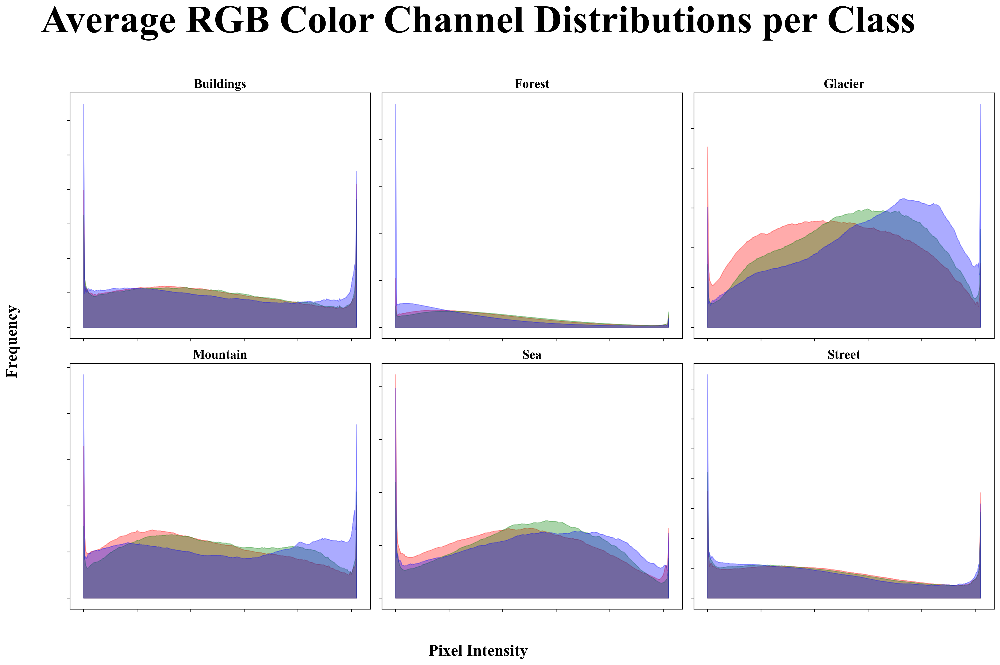

In [15]:
classes = sorted(train_df["class"].unique())[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.set_dpi(300)
fig.patch.set_alpha(0)  
fig.suptitle("Average RGB Color Channel Distributions per Class", 
             fontsize=48, fontweight='bold', fontname='Times New Roman', 
             color='black', y=0.98)

for ax, class_name in zip(axes.flat, classes):
    class_images = train_df[train_df["class"] == class_name]["image"].tolist()
    
    red_hist = np.zeros(256, dtype=np.int64)
    green_hist = np.zeros(256, dtype=np.int64)
    blue_hist = np.zeros(256, dtype=np.int64)
    
    for img_path in tqdm(class_images, desc=f"{class_name} images", leave=False):
        try:
            img = Image.open(img_path).convert('RGB')
            np_img = np.array(img)
            hist_r, _ = np.histogram(np_img[:, :, 0], bins=256, range=(0, 255))
            hist_g, _ = np.histogram(np_img[:, :, 1], bins=256, range=(0, 255))
            hist_b, _ = np.histogram(np_img[:, :, 2], bins=256, range=(0, 255))
            red_hist += hist_r
            green_hist += hist_g
            blue_hist += hist_b
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
    
    x = np.arange(256)
    ax.fill_between(x, 0, red_hist, color='red', alpha=0.33)
    ax.fill_between(x, 0, green_hist, color='green', alpha=0.33)
    ax.fill_between(x, 0, blue_hist, color='blue', alpha=0.33)
    
    ax.set_title(class_name.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 
                           'fontname':'Times New Roman', 'color':'black'})
    # Remove individual axis labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.tick_params(axis='both', which='major', labelsize=10, colors='black')

# Add common x and y axis labels outside the subplots:
fig.text(0.5, 0.05, 'Pixel Intensity', ha='center', fontsize=20, fontweight='bold', 
         fontname='Times New Roman', color='black')
fig.text(0.05, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=20, 
         fontweight='bold', fontname='Times New Roman', color='black')

plt.tight_layout(rect=[0.1, 0.1, 1, 0.95])
plt.show()

# Train / Test Split

In [16]:
from sklearn.model_selection import train_test_split

train_list, val_list = [], []

for class_name, group in train_df.groupby("class"):
    train_split, val_split = train_test_split(
        group, test_size=0.2, random_state=42, shuffle=True, stratify=None
    )
    train_list.append(train_split)
    val_list.append(val_split)

train_split_df = pd.concat(train_list).reset_index(drop=True)
val_split_df = pd.concat(val_list).reset_index(drop=True)

print(f"Train split: {train_split_df.shape}, Val split: {val_split_df.shape}")

Train split: (11187, 5), Val split: (2799, 5)


https://github.com/shizuo-kaji/CubicalRipser_3dim/blob/master/demo/cubicalripser.ipynb

In [17]:
def compute_persistence_diagrams(img2d):
    pd_v = cr.computePH(img2d)
    pd_v = pd_v[:, :3]
    return [pd_v[pd_v[:, 0] == i][:, 1:] for i in range(3)]

In [18]:
def diagram_to_landscape(diag, num_landscapes = 3, resolution = 100):
    L = Landscape(num_landscapes = num_landscapes, resolution = resolution)
    return L.fit_transform([diag])[0]

In [19]:
def compute_image_topology_vector(img_path, dims = [1], num_landscapes = 3, resolution = 100):
    img2d = np.array(Image.open(img_path).convert("L"))
    pds_v = compute_persistence_diagrams(img2d)
    vecs = [diagram_to_landscape(pds_v[dim], num_landscapes, resolution) for dim in dims]
    return np.concatenate(vecs)

In [20]:
train_vectors = [compute_image_topology_vector(row["image"], dims=[1], num_landscapes=3, resolution=100)
                 for _, row in tqdm(train_split_df.iterrows(), total=len(train_split_df))]
train_vector_df = pd.DataFrame(train_vectors)
train_full_df = pd.concat([train_split_df, train_vector_df], axis=1)

val_vectors = [compute_image_topology_vector(row["image"], dims=[1], num_landscapes=3, resolution=100)
               for _, row in tqdm(val_split_df.iterrows(), total=len(val_split_df))]
val_vector_df = pd.DataFrame(val_vectors)
val_full_df = pd.concat([val_split_df, val_vector_df], axis=1)

100%|██████████████████████████████████████████████████████████████████████████████| 2799/2799 [00:36<00:00, 76.40it/s]


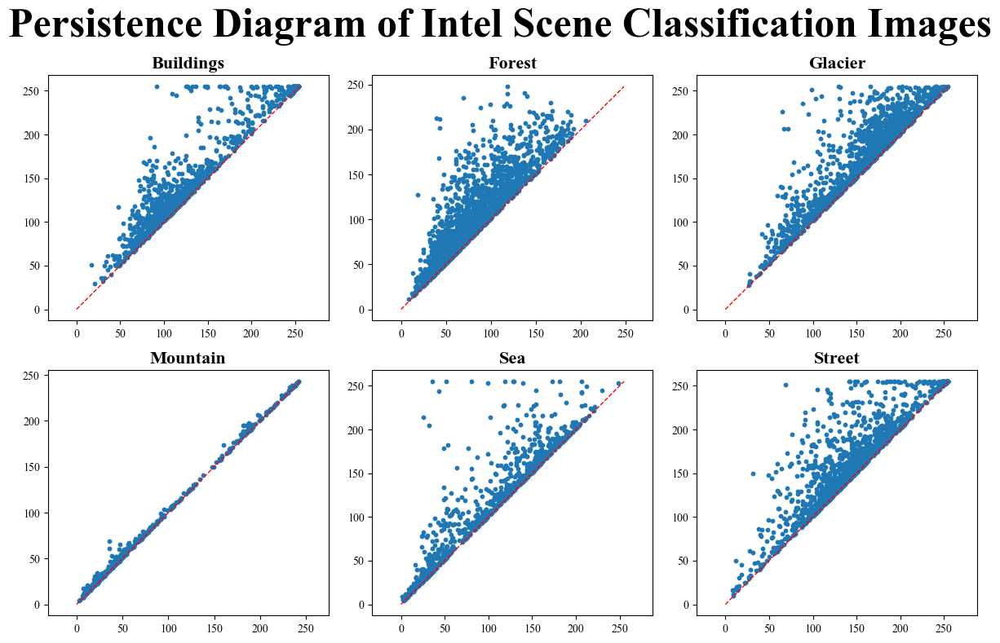

In [21]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle("Persistence Diagram of Intel Scene Classification Images", 
             fontsize=36, fontweight='bold', fontname='Times New Roman', color='black')

for ax, class_name in zip(axes.flat, sorted(train_df["class"].unique())[:6]):
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    img = np.array(Image.open(img_path).convert("L"))
    pdgms = compute_persistence_diagrams(img)
    diag = pdgms[1]
    ax.scatter(diag[:, 0], diag[:, 1], s=10)
    ax.plot([0, diag[:, 1].max()], [0, diag[:, 1].max()], 'r--', linewidth=1)
    ax.set_title(class_name.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})
    ax.axis("equal")

plt.tight_layout()
plt.show()

https://ripser.scikit-tda.org/en/latest/notebooks/Lower%20Star%20Image%20Filtrations.html

In [22]:
tqdm.pandas()

def compute_hole_positions(img_path, thresh=0.7):
    cells_original = plt.imread(img_path)
    cells_grey = np.asarray(Image.fromarray(cells_original).convert('L'))
    
    smoothed = ndimage.uniform_filter(cells_grey.astype(np.float64), size=10)
    smoothed += 0.01 * np.random.randn(*smoothed.shape)
    
    dgm = compute_persistence_diagrams(-smoothed)[1]
    
    idxs = np.arange(dgm.shape[0])
    idxs = idxs[np.abs(dgm[:, 1] - dgm[:, 0]) > thresh]
    
    X, Y = np.meshgrid(np.arange(smoothed.shape[1]), np.arange(smoothed.shape[0]))
    X, Y = X.flatten(), Y.flatten()
    
    positions = []
    for idx in idxs:
        bidx = np.argmin(np.abs(smoothed + dgm[idx, 0]))
        positions.append((int(X[bidx]), int(Y[bidx])))
    return positions

train_split_df["hole_positions"] = train_split_df["image"].progress_apply(lambda p: compute_hole_positions(p, thresh=0.7))
val_split_df["hole_positions"] = val_split_df["image"].progress_apply(lambda p: compute_hole_positions(p, thresh=0.7))

100%|██████████████████████████████████████████████████████████████████████████████| 2799/2799 [00:30<00:00, 90.81it/s]


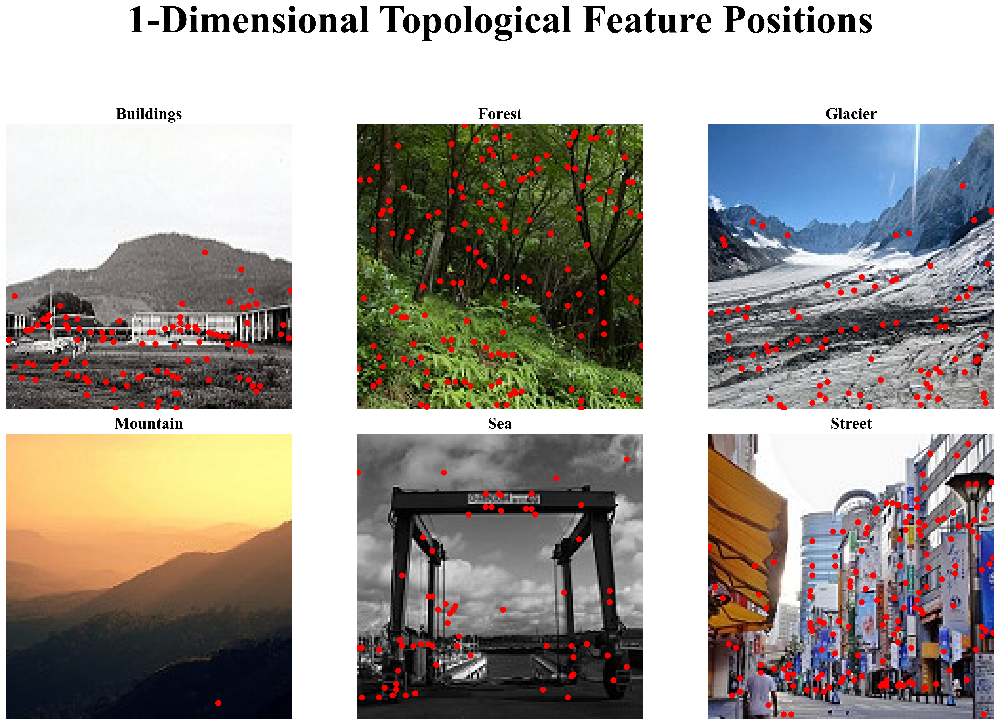

In [24]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.set_dpi(300)
fig.patch.set_alpha(0)  
fig.suptitle("1-Dimensional Topological Feature Positions", 
             fontsize=48, fontweight='bold', fontname='Times New Roman', 
             color='black', y=1.02)

for ax, class_name in zip(axes.flat, sorted(train_df["class"].unique())[:6]):
    row = train_df[train_df["class"] == class_name].iloc[0]
    img_path = row["image"]
    
    cells_original = plt.imread(img_path)
    
    positions = compute_hole_positions(img_path, thresh=0.7)
    
    ax.imshow(cells_original)
    
    for (x, y) in positions:
        ax.scatter(x, y, s=40, c='r')
    
    ax.axis('off')
    ax.set_title(class_name.capitalize(), 
                 fontdict={'fontsize':20, 'fontweight':'bold', 
                           'fontname':'Times New Roman', 'color':'black'})

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

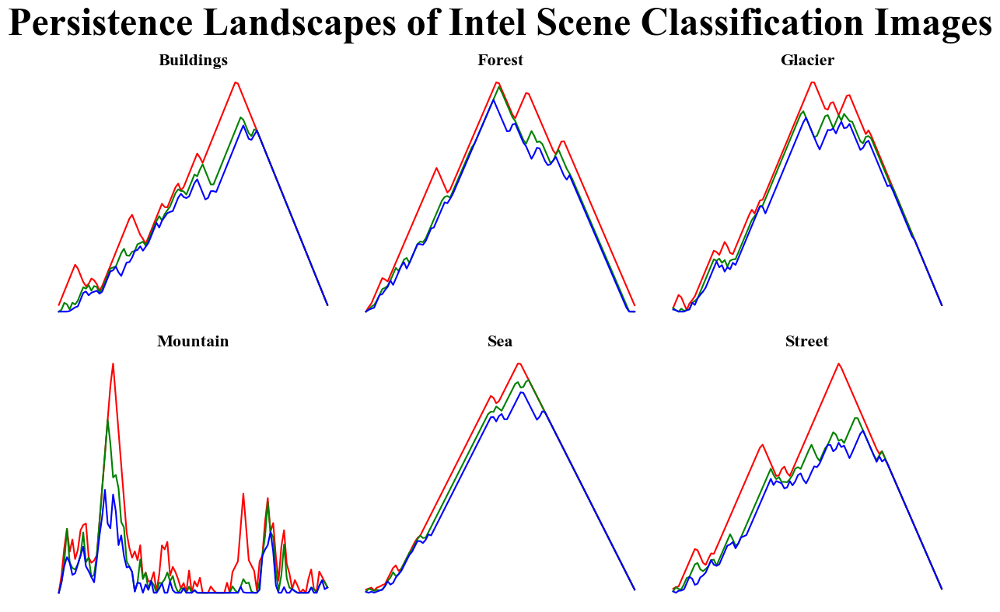

In [25]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle("Persistence Landscapes of Intel Scene Classification Images", 
             fontsize=36, fontweight='bold', fontname='Times New Roman', color='black')

colors = ["red", "green", "blue"]

for ax, class_name in zip(axes.flat, sorted(train_df["class"].unique())[:6]):
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    vec = compute_image_topology_vector(img_path, dims=[1], num_landscapes=3, resolution=100)
    for i in range(3):
        ax.plot(vec[i * 100:(i + 1) * 100], color=colors[i])
    ax.set_title(class_name.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})
    ax.axis("off")

plt.tight_layout()
plt.show()

https://github.com/navpreetnp7/Image-Classification-using-Densenet/blob/main/SynergyLabs.Task.ipynb

# DenseNet Implementation

In [26]:
class ImageToLandscapeDataset(Dataset):
    def __init__(self, dataframe, transform = None):
        self.df = dataframe
        self.transform = transform
        self.vec_cols = [col for col in dataframe.columns if isinstance(col, int)]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["image"]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        vec = torch.tensor(row[self.vec_cols].values.astype(np.float32))
        return img, vec

In [27]:
class DenseNetToLandscape(nn.Module):
    def __init__(self, out_dim, unfreeze_top_k=0):
        super().__init__()
        self.base = models.densenet121(pretrained=True)
        
        for param in self.base.parameters():
            param.requires_grad = False

        if unfreeze_top_k > 0:
            layers = list(self.base.features.children())[::-1]
            count = 0
            for layer in layers:
                for param in layer.parameters():
                    param.requires_grad = True
                count += 1
                if count >= unfreeze_top_k:
                    break

        in_features = self.base.classifier.in_features
        self.base.classifier = nn.Linear(in_features, out_dim)

    def forward(self, x):
        return self.base(x)

In [28]:
def train_landscape_model(model, train_loader, val_loader, optimizer, loss_fn, device, epochs=10):
    model.to(device)
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0

        # Wrap the train_loader in tqdm
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1} [Train]", leave=False)
        for images, vectors in pbar:
            images, vectors = images.to(device), vectors.to(device)
            optimizer.zero_grad()
            preds = model(images)
            loss = loss_fn(preds, vectors)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * images.size(0)
            pbar.set_postfix(loss=loss.item())

        avg_train_loss = train_loss / len(train_loader.dataset)
        train_losses.append(avg_train_loss)

        # Validation loop
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            pbar = tqdm(val_loader, desc=f"Epoch {epoch+1} [Val]", leave=False)
            for images, vectors in pbar:
                images, vectors = images.to(device), vectors.to(device)
                preds = model(images)
                loss = loss_fn(preds, vectors)
                val_loss += loss.item() * images.size(0)
                pbar.set_postfix(loss=loss.item())

        avg_val_loss = val_loss / len(val_loader.dataset)
        val_losses.append(avg_val_loss)

        print(f"Epoch {epoch+1}: Train Loss = {avg_train_loss:.4f}, Val Loss = {avg_val_loss:.4f}")

    return model, train_losses, val_losses

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

train_dataset = ImageToLandscapeDataset(train_full_df, transform=transform)
val_dataset = ImageToLandscapeDataset(val_full_df, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

In [30]:
def set_relu_to_non_inplace(model):
    for module in model.modules():
        if isinstance(module, torch.nn.ReLU):
            module.inplace = False


model = DenseNetToLandscape(out_dim=300)
set_relu_to_non_inplace(model)            
optimizer = optim.Adam(model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()

C:\Users\VeryA\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\VeryA\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [31]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate_model(model, dataloader, device):
    model.eval()
    y_true, y_pred = [], []

    with torch.no_grad():
        for images, vectors in dataloader:
            images, vectors = images.to(device), vectors.to(device)
            preds = model(images)
            y_true.append(vectors.cpu().numpy())
            y_pred.append(preds.cpu().numpy())

    y_true = np.vstack(y_true)
    y_pred = np.vstack(y_pred)

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"RMSE: {rmse:.4f}")
    print(f"MAE : {mae:.4f}")
    print(f"R²  : {r2:.4f}")

    return {"RMSE": rmse, "MAE": mae, "R2": r2}

In [32]:
import torch.optim as optim
from itertools import product

results = []
best_val_loss = float('inf')
best_model = None
best_train_losses = None
best_val_losses = None
best_hyperparams = {}

lrs = [5e-4, 1e-3]
decays = [0, 1e-5]
unfreeze_k = [0, 2] 


search_space = list(product(lrs, decays, unfreeze_k))

for lr, wd, k in search_space:
    print(f"\n--- Training: LR={lr}, WD={wd}, UnfreezeTopK={k} ---")
    model = DenseNetToLandscape(out_dim=300, unfreeze_top_k=k)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, weight_decay=wd)
    
    model, train_losses, val_losses = train_landscape_model(
        model, train_loader, val_loader, optimizer, loss_fn, device, epochs=4
    )
    
    metrics = evaluate_model(model, val_loader, device)
    metrics.update({
        "LR": lr,
        "WeightDecay": wd,
        "UnfreezeTopK": k,
        "TrainLossFinal": train_losses[-1],
        "ValLossFinal": val_losses[-1],
        "TrainLosses": train_losses,
        "ValLosses": val_losses
    })
    
    results.append(metrics)
    
    if val_losses[-1] < best_val_loss:
        best_val_loss = val_losses[-1]
        best_model = model  # best_model remains on GPU
        best_train_losses = train_losses
        best_val_losses = val_losses
        best_hyperparams = {"LR": lr, "WeightDecay": wd, "UnfreezeTopK": k}


--- Training: LR=0.0005, WD=1e-05, UnfreezeTopK=4 ---


Epoch 1: Train Loss = 569.9935, Val Loss = 179.2503


Epoch 2: Train Loss = 178.4046, Val Loss = 144.9983


Epoch 3: Train Loss = 151.6203, Val Loss = 136.4602


Epoch 4: Train Loss = 138.6837, Val Loss = 126.4337
RMSE: 11.2443
MAE : 7.8791
R²  : 0.6374


C:\Users\VeryA\AppData\Local\Temp\ipykernel_8108\4145811741.py:20: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = summary_df.applymap(lambda x: format_val(x)).values.tolist()


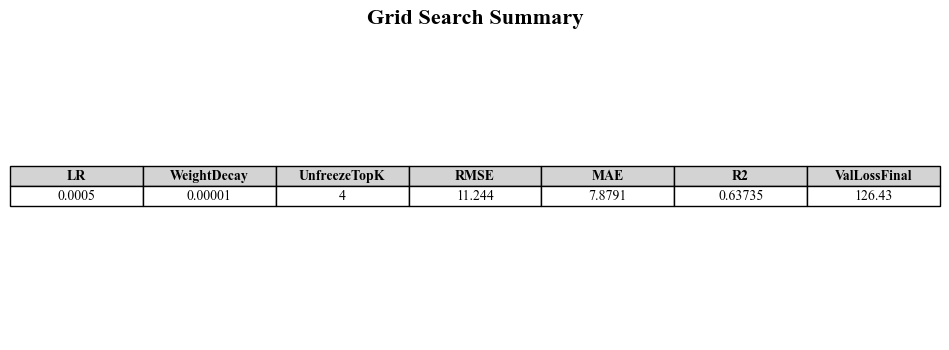

In [33]:
metrics_df = pd.DataFrame(results)
summary_df = metrics_df[["LR", "WeightDecay", "UnfreezeTopK", "RMSE", "MAE", "R2", "ValLossFinal"]]
summary_df = summary_df.sort_values("ValLossFinal")

def format_val(val):
    try:
        val = float(val)
        s = f"{val:.5g}"  
        if "e" in s or "E" in s:  
            s = f"{val:.5f}"
        return s
    except:
        return str(val)

formatted_values = summary_df.applymap(lambda x: format_val(x)).values.tolist()

fig, ax = plt.subplots(figsize=(10, 4))
ax.axis('off')  

table = ax.table(
    cellText=formatted_values,
    colLabels=summary_df.columns,
    cellLoc='center',
    loc='center'
)

table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)

for (row, col), cell in table.get_celld().items():
    cell.set_edgecolor('black')
    if row == 0:
        cell.set_text_props(fontproperties={'weight': 'bold', 'family': 'Times New Roman'})
        cell.set_facecolor('#d3d3d3') 
    else:
        cell.set_text_props(fontproperties={'family': 'Times New Roman'})

plt.title("Grid Search Summary", fontsize=16, fontweight='bold', fontname='Times New Roman', color='black')

plt.savefig("grid_search_summary.png", dpi=300, transparent=True, bbox_inches='tight')
plt.show()

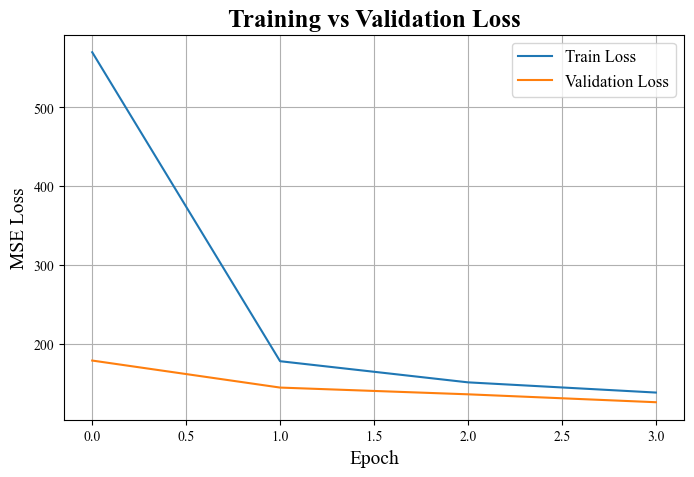

In [34]:
plt.figure(figsize=(8, 5))
plt.plot(best_train_losses, label='Train Loss')
plt.plot(best_val_losses, label='Validation Loss')
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("MSE Loss", fontsize=14)
plt.title("Training vs Validation Loss", fontsize=18, fontweight='bold', fontname='Times New Roman', color='black')
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

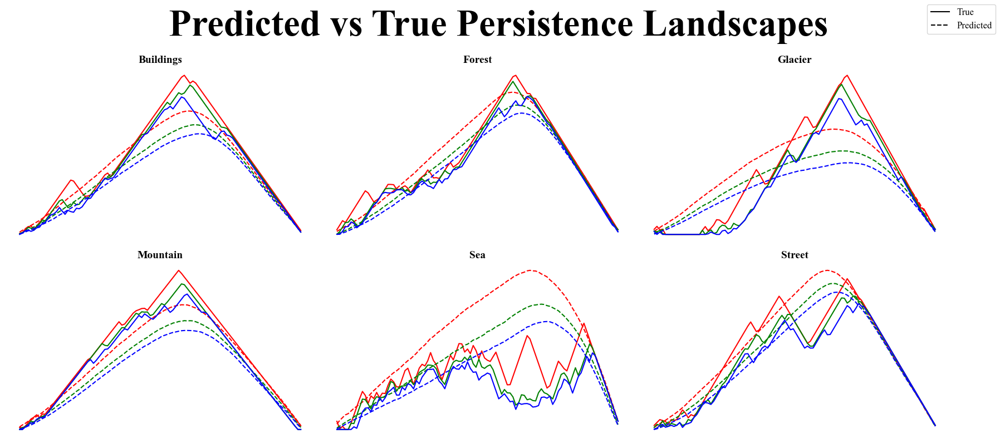

In [36]:
from matplotlib.lines import Line2D
from PIL import Image

colors = ["red", "green", "blue"]
class_names = sorted(val_full_df["class"].unique())

fig, axes = plt.subplots(2, 3, figsize=(18, 8))
fig.suptitle("Predicted vs True Persistence Landscapes", 
             fontsize=48, fontweight='bold', fontname='Times New Roman', color='black')

best_model.eval()
with torch.no_grad():
    for ax, class_name in zip(axes.flat, class_names[:6]):
        sample_row = val_full_df[val_full_df["class"] == class_name].sample(1).iloc[0]
        img = Image.open(sample_row["image"]).convert("RGB")
        img_tensor = transform(img).unsqueeze(0).to(device)
        
        true_vec = torch.tensor(sample_row[[col for col in val_full_df.columns if isinstance(col, int)]].values.astype(np.float32))
        pred_vec = best_model(img_tensor).squeeze().cpu().numpy()
        
        xs = np.arange(100)
        for i in range(3):
            ax.plot(xs, true_vec[i * 100:(i + 1) * 100], color=colors[i], linestyle="-")
            ax.plot(xs, pred_vec[i * 100:(i + 1) * 100], color=colors[i], linestyle="--")
        
        ax.set_title(class_name.capitalize(), fontsize=14, fontweight='bold', fontname='Times New Roman', color='black')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)

custom_lines = [
    Line2D([0], [0], color="black", linestyle="-", label="True"),
    Line2D([0], [0], color="black", linestyle="--", label="Predicted")
]
fig.legend(handles=custom_lines, loc="upper right", fontsize=12)
plt.tight_layout()
plt.subplots_adjust(top=0.85, right=0.95)
plt.show()

# Feature Importance

In [37]:
import torch.nn.functional as F
from torchvision.models import densenet121

class SHAPSafeDenseNet121(torch.nn.Module):
    def __init__(self, out_dim):
        super().__init__()
        base = densenet121(pretrained=True)

        for param in base.parameters():
            param.requires_grad = False

        self.features = base.features
        self.pool = torch.nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = torch.nn.Linear(base.classifier.in_features, out_dim)

        for param in self.classifier.parameters():
            param.requires_grad = True

    def forward(self, x):
        features = self.features(x)
        features = F.relu(features.clone(), inplace=False) 
        out = self.pool(features)
        out = torch.flatten(out, 1)
        out = self.classifier(out)
        return out

In [38]:
model = SHAPSafeDenseNet121(out_dim=300)
model.to(device)
model.eval()
print()

C:\Users\VeryA\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\VeryA\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [39]:
import shap
import torch
from torchvision import transforms
from torch.utils.data import DataLoader

def setup_shap_explainer(model, background_loader, device):
    model.eval()
    model.to(device)
    background_batch = next(iter(background_loader))[0][:3].to(device)  # Use 3 background images for speed
    explainer = shap.GradientExplainer(model, background_batch)
    return explainer

def compute_shap_values(explainer, image_batch, top_k=1):
    shap_values = explainer.shap_values(image_batch, ranked_outputs=top_k)
    return shap_values 

def visualize_shap_images(sample_paths, shap_values, transform, model_input_size=(3, 256, 256)):
    fig, axes = plt.subplots(1, len(sample_paths), figsize=(4 * len(sample_paths), 4))
    if len(sample_paths) == 1:
        axes = [axes]  

    for i, (img_path, ax) in enumerate(zip(sample_paths, axes)):
        img = Image.open(img_path).convert("RGB")
        img_resized = img.resize((model_input_size[2], model_input_size[1]))
        img_np = np.array(img_resized) / 255.0  

        per_output_vals = []
        for sv in shap_values:
            val = sv[i]
            if isinstance(val, torch.Tensor):
                val = val.detach().cpu().numpy()
            per_output_vals.append(val)
      
        shapes = [np.array(val).shape for val in per_output_vals]
        if len(set(shapes)) == 1:
            aggregated = np.mean(np.abs(np.stack(per_output_vals)), axis=0)
        else:
            aggregated = np.abs(per_output_vals[0])
            
        shap_heatmap = np.mean(aggregated, axis=0)

        ax.imshow(img_np)
        ax.imshow(shap_heatmap, cmap='hot', alpha=0.6)
        ax.axis("off")

    plt.tight_layout()
    plt.show

background_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)
explainer = setup_shap_explainer(model, background_loader, device)

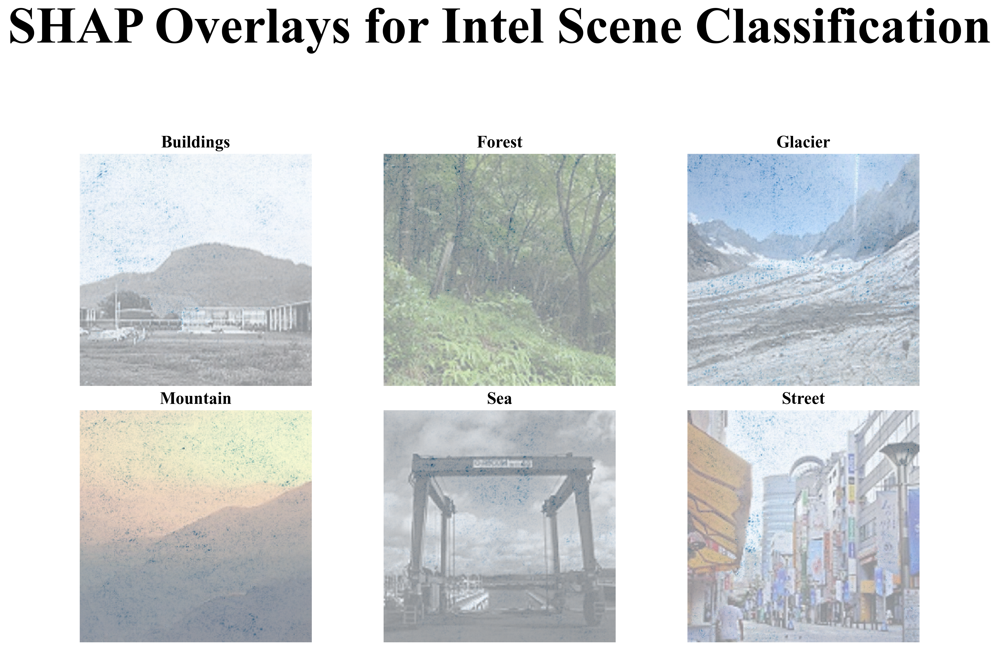

In [41]:
classes = sorted(train_df["class"].unique())[:6]

display_images = []
shap_overlays = []
for class_name in classes:
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    
    img = Image.open(img_path).convert("RGB")
    batch_img = transform(img).unsqueeze(0).to(device)
    
    shap_values = compute_shap_values(explainer, batch_img, top_k=1)
    
    val = shap_values[0][0]
    if isinstance(val, torch.Tensor):
        val = val.detach().cpu().numpy()
    shap_overlay = np.mean(np.abs(val), axis=0)
    shap_overlays.append(shap_overlay)
    
    disp_img = img.resize((256, 256))
    disp_img_np = np.array(disp_img) / 255.0
    display_images.append(disp_img_np)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.set_dpi(300)
fig.patch.set_alpha(0)  
fig.suptitle("SHAP Overlays for Intel Scene Classification", 
             fontsize=48, fontweight='bold', fontname='Times New Roman', color='black', y=1.05)

for ax, cls, img_np, shap_overlay in zip(axes.flat, classes, display_images, shap_overlays):
    ax.imshow(img_np)
    ax.imshow(shap_overlay, cmap='Blues', alpha=0.6)
    ax.axis("off")
    ax.set_title(cls.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

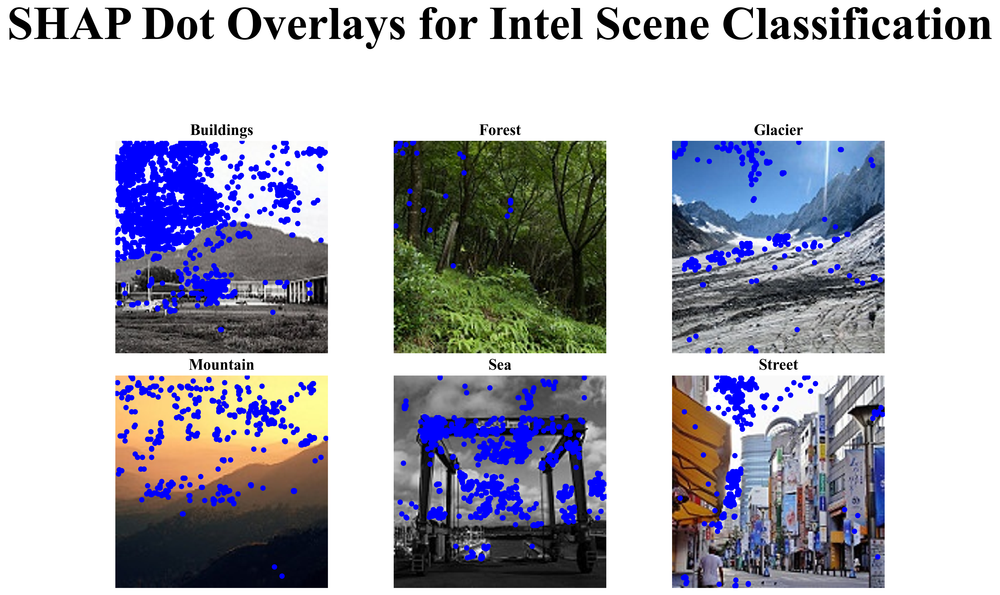

In [42]:
classes = sorted(train_df["class"].unique())[:6]

display_images = []
shap_dots = [] 
threshold = 0.0035 

for class_name in classes:
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    
    img = Image.open(img_path).convert("RGB")
    batch_img = transform(img).unsqueeze(0).to(device)
    
    shap_values = compute_shap_values(explainer, batch_img, top_k=1)
    
    val = shap_values[0][0]
    if isinstance(val, torch.Tensor):
        val = val.detach().cpu().numpy()
    shap_overlay = np.mean(np.abs(val), axis=0)
    shap_overlay = np.squeeze(shap_overlay)
    
    disp_img = img.resize((256, 256))
    disp_img_np = np.array(disp_img) / 255.0
    display_images.append(disp_img_np)
    
    shap_overlay_resized = np.array(Image.fromarray((shap_overlay * 255).astype(np.uint8)).resize((256,256))) / 255.0
    
    indices = np.where(shap_overlay_resized > threshold)
    shap_dots.append((indices[1], indices[0])) 

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.set_dpi(300)
fig.patch.set_alpha(0) 
fig.suptitle("SHAP Dot Overlays for Intel Scene Classification", 
             fontsize=48, fontweight='bold', fontname='Times New Roman', color='black', y=1.05)

for ax, cls, img_np, (x_coords, y_coords) in zip(axes.flat, classes, display_images, shap_dots):
    ax.imshow(img_np)
    ax.scatter(x_coords, y_coords, s=20, color='blue') 
    ax.axis("off")
    ax.set_title(cls.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

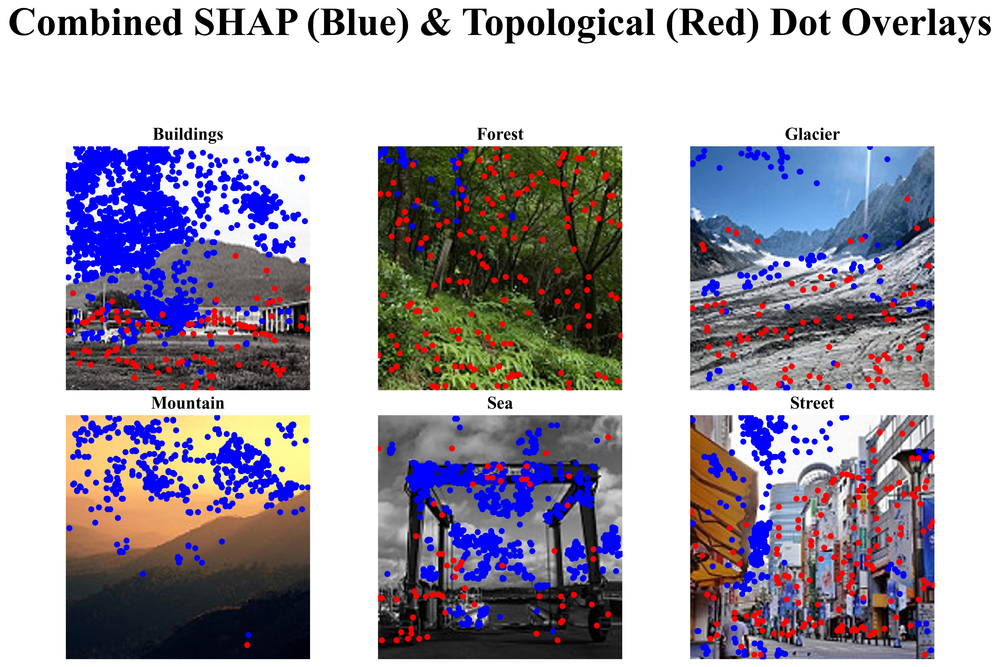

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch

# Define the 6 classes to display (sorted order)
classes = sorted(train_df["class"].unique())[:6]

display_images = []
shap_dots = []    # Blue dot coordinates from SHAP values
hole_positions = []  # Red dot coordinates from topological features
shap_threshold = 0.0035  # Adjust threshold for SHAP dot extraction

for class_name in classes:
    # Get one image path for this class (first image)
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    
    # --- Load image and prepare display version ---
    # Load the image (for display, we use PIL) and resize to 256x256
    img = Image.open(img_path).convert("RGB")
    disp_img = img.resize((256, 256))
    disp_img_np = np.array(disp_img) / 255.0
    display_images.append(disp_img_np)
    
    # --- Compute SHAP dot coordinates (blue dots) ---
    # Transform the image and compute SHAP values (top_k=1 for speed)
    batch_img = transform(img).unsqueeze(0).to(device)
    shap_values = compute_shap_values(explainer, batch_img, top_k=1)
    val = shap_values[0][0]
    if isinstance(val, torch.Tensor):
        val = val.detach().cpu().numpy()
    # Average over channels to get a single SHAP mask and squeeze extra dimensions
    shap_overlay = np.squeeze(np.mean(np.abs(val), axis=0))
    
    # Resize the SHAP overlay to 256x256 so it aligns with disp_img_np.
    # Scale to 0-255, resize, then convert back to 0-1.
    shap_overlay_resized = np.array(
        Image.fromarray((shap_overlay * 255).astype(np.uint8)).resize((256, 256))
    ) / 255.0
    # Get dot coordinates (columns = x, rows = y) where the SHAP value exceeds the threshold.
    indices = np.where(shap_overlay_resized > shap_threshold)
    shap_dots.append((indices[1], indices[0]))  # (x_coords, y_coords)
    
    # --- Compute Topological Hole Positions (red dots) ---
    # Use your helper function; these coordinates are in the original image's coordinate system.
    positions = compute_hole_positions(img_path, thresh=0.7)
    # Scale hole positions from original image size to 256x256.
    orig_img = plt.imread(img_path)
    orig_h, orig_w = orig_img.shape[0], orig_img.shape[1]
    scaled_positions = []
    for (x, y) in positions:
        x_scaled = x * 256 / orig_w
        y_scaled = y * 256 / orig_h
        scaled_positions.append((x_scaled, y_scaled))
    hole_positions.append(scaled_positions)

# --- Plotting: One 2x3 figure with both overlays ---
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.set_dpi(300)
fig.patch.set_alpha(0)  # Transparent background
fig.suptitle("Combined SHAP (Blue) & Topological (Red) Dot Overlays", 
             fontsize=36, fontweight='bold', fontname='Times New Roman', color='black', y=1.05)

for ax, cls, img_np, blue_dots, red_dots in zip(axes.flat, classes, display_images, shap_dots, hole_positions):
    ax.imshow(img_np)
    # Overlay blue dots from SHAP values
    ax.scatter(blue_dots[0], blue_dots[1], s=20, color='blue')
    # Overlay red dots from topological hole positions
    for (x, y) in red_dots:
        ax.scatter(x, y, s=20, color='red')
    ax.axis("off")
    ax.set_title(cls.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


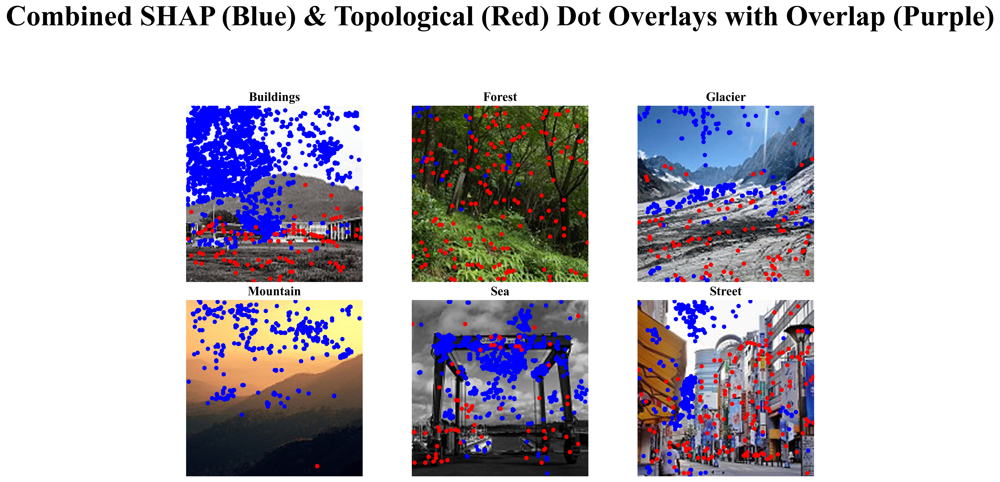

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch

# Define the 6 classes to display (sorted order)
classes = sorted(train_df["class"].unique())[:6]

display_images = []
shap_dots = []    # Blue dot coordinates from SHAP values
hole_positions = []  # Red dot coordinates from topological features
overlap_dots = []  # Purple dot coordinates for overlap between SHAP and topological dots
shap_threshold = 0.0035  # Adjust threshold for SHAP dot extraction

for class_name in classes:
    # Get one image path for this class (first image)
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    
    # --- Load image and prepare display version ---
    # Load the image (for display, we use PIL) and resize to 256x256
    img = Image.open(img_path).convert("RGB")
    disp_img = img.resize((256, 256))
    disp_img_np = np.array(disp_img) / 255.0
    display_images.append(disp_img_np)
    
    # --- Compute SHAP dot coordinates (blue dots) ---
    # Transform the image and compute SHAP values (top_k=1 for speed)
    batch_img = transform(img).unsqueeze(0).to(device)
    shap_values = compute_shap_values(explainer, batch_img, top_k=1)
    val = shap_values[0][0]
    if isinstance(val, torch.Tensor):
        val = val.detach().cpu().numpy()
    # Average over channels to get a single SHAP mask and squeeze extra dimensions
    shap_overlay = np.squeeze(np.mean(np.abs(val), axis=0))
    
    # Resize the SHAP overlay to 256x256 so it aligns with disp_img_np.
    shap_overlay_resized = np.array(
        Image.fromarray((shap_overlay * 255).astype(np.uint8)).resize((256, 256))
    ) / 255.0
    # Get dot coordinates (columns = x, rows = y) where the SHAP value exceeds the threshold.
    indices = np.where(shap_overlay_resized > shap_threshold)
    shap_dots.append((indices[1], indices[0]))  # (x_coords, y_coords)
    
    # --- Compute Topological Hole Positions (red dots) ---
    positions = compute_hole_positions(img_path, thresh=0.7)
    # Scale hole positions from original image size to 256x256.
    orig_img = plt.imread(img_path)
    orig_h, orig_w = orig_img.shape[0], orig_img.shape[1]
    scaled_positions = []
    for (x, y) in positions:
        x_scaled = x * 256 / orig_w
        y_scaled = y * 256 / orig_h
        scaled_positions.append((x_scaled, y_scaled))
    hole_positions.append(scaled_positions)
    
    # --- Compute Overlap (purple dots) ---
    overlap_x = []
    overlap_y = []
    for (shap_x, shap_y), (topo_x, topo_y) in zip(zip(shap_dots[-1][0], shap_dots[-1][1]), scaled_positions):
        if (shap_x == topo_x) and (shap_y == topo_y):
            overlap_x.append(shap_x)
            overlap_y.append(shap_y)
    overlap_dots.append((overlap_x, overlap_y))

# --- Plotting: One 2x3 figure with both overlays ---
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.set_dpi(300)
fig.patch.set_alpha(0)  # Transparent background
fig.suptitle("Combined SHAP (Blue) & Topological (Red) Dot Overlays with Overlap (Purple)", 
             fontsize=36, fontweight='bold', fontname='Times New Roman', color='black', y=1.05)

for ax, cls, img_np, blue_dots, red_dots, overlap in zip(axes.flat, classes, display_images, shap_dots, hole_positions, overlap_dots):
    ax.imshow(img_np)
    # Overlay blue dots from SHAP values
    ax.scatter(blue_dots[0], blue_dots[1], s=20, color='blue')
    # Overlay red dots from topological hole positions
    for (x, y) in red_dots:
        ax.scatter(x, y, s=20, color='red')
    # Overlay purple dots where SHAP and topological holes overlap
    ax.scatter(overlap[0], overlap[1], s=20, color='purple')
    ax.axis("off")
    ax.set_title(cls.capitalize(), 
                 fontdict={'fontsize':16, 'fontweight':'bold', 'fontname':'Times New Roman', 'color':'black'})

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [45]:
import numpy as np
import torch
from tqdm import tqdm

def compute_pixel_comparison(shap_dots, hole_positions, shap_threshold=0.0035):
    """
    Computes the overlap between SHAP values and topological hole positions for each image.
    
    shap_dots: List of SHAP dot coordinates [(x_coords, y_coords)] for each class/image.
    hole_positions: List of hole positions [(x_coords, y_coords)] for each class/image.
    shap_threshold: Threshold value for SHAP to classify a pixel as important (default: 0.0035).
    
    Returns: A list of overlap ratios for each image/class.
    """
    comparisons = []

    # Iterate over each class
    for class_name, (shap_coords, topo_coords) in tqdm(zip(classes, zip(shap_dots, hole_positions)), 
                                                      total=len(classes), 
                                                      desc="Processing classes"):
        total_pixels = len(shap_coords[0])  # Number of SHAP coordinates for the image
        overlap_count = 0
        
        # Calculate overlap between SHAP and Topological hole positions
        for shap_x, shap_y in zip(shap_coords[0], shap_coords[1]):
            for topo_x, topo_y in topo_coords:
                if abs(shap_x - topo_x) < 1 and abs(shap_y - topo_y) < 1:  # Allow small tolerance for pixel proximity
                    overlap_count += 1
                    break  # Stop once a match is found for this pixel
        
        # Compute the ratio of overlap (how many SHAP and topo dots match)
        overlap_ratio = overlap_count / total_pixels if total_pixels > 0 else 0
        comparisons.append((class_name, overlap_ratio))

    return comparisons

# Example: Using the function with SHAP dots and hole positions
comparisons = compute_pixel_comparison(shap_dots, hole_positions)

# Displaying results
for class_name, overlap_ratio in comparisons:
    print(f"Class: {class_name}, Overlap Ratio: {overlap_ratio:.4f}")


Processing classes: 100%|████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00,  8.09it/s]

Class: buildings, Overlap Ratio: 0.0014
Class: forest, Overlap Ratio: 0.0270
Class: glacier, Overlap Ratio: 0.0000
Class: mountain, Overlap Ratio: 0.0000
Class: sea, Overlap Ratio: 0.0080
Class: street, Overlap Ratio: 0.0000


In [46]:
import numpy as np
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image

def compute_overlap_ratio_for_image(img_path, transform, explainer, shap_threshold=0.0035, target_size=256):
    """
    For a given image (img_path), compute the overlap ratio between:
      - The SHAP heatmap (obtained by averaging the absolute SHAP values over channels after resizing to target_size)
      - The topological hole positions (obtained from compute_hole_positions and scaled to target_size)
    
    The overlap ratio is defined as:
        (Number of topological hole positions that fall on an "important" SHAP pixel) / 
        (Total number of topological hole positions)
    
    Parameters:
        img_path (str): Path to the image.
        transform: Torchvision transform for model input.
        explainer: A preconfigured SHAP explainer.
        shap_threshold (float): Threshold for flagging a pixel as “important” from the SHAP heatmap.
        target_size (int): The size to which the image and heatmap are resized (assumed square).
    
    Returns:
        overlap_ratio (float): The ratio of topological features overlapping with important SHAP pixels.
    """
    # Load image for both SHAP and to get original dimensions
    img = Image.open(img_path).convert("RGB")
    # Get original dimensions (for scaling the hole positions)
    orig_img = np.array(Image.open(img_path))
    orig_h, orig_w = orig_img.shape[0], orig_img.shape[1]
    
    # --- Compute SHAP Heatmap ---
    # Transform the image and compute SHAP values (top_k=1 for speed)
    batch_img = transform(img).unsqueeze(0).to(device)
    shap_values = compute_shap_values(explainer, batch_img, top_k=1)
    # Get the first output and average over channels to form the heatmap
    val = shap_values[0][0]
    if isinstance(val, torch.Tensor):
        val = val.detach().cpu().numpy()
    # Average over channels; result shape might be (H, W, 1) or (H, W)
    shap_overlay = np.mean(np.abs(val), axis=0)
    # Squeeze to remove extra singleton dimensions (e.g., (256,256,1) -> (256,256))
    shap_overlay = np.squeeze(shap_overlay)
    
    # Resize the SHAP overlay to the target_size (e.g., 256×256)
    shap_overlay_resized = np.array(
        Image.fromarray((shap_overlay * 255).astype(np.uint8)).resize((target_size, target_size))
    ) / 255.0
    # Create a binary mask where pixels with SHAP value > threshold are marked True
    shap_mask = shap_overlay_resized > shap_threshold

    # --- Compute Topological Hole Positions ---
    topo_positions = compute_hole_positions(img_path, thresh=0.7)
    # Scale each hole coordinate from the original image size to target_size
    scaled_topo_positions = []
    for (x, y) in topo_positions:
        x_scaled = x * target_size / orig_w
        y_scaled = y * target_size / orig_h
        # Round and convert to integer pixel positions
        scaled_topo_positions.append((int(round(x_scaled)), int(round(y_scaled))))
    
    # --- Compute Overlap ---
    overlap_count = 0
    for (x, y) in scaled_topo_positions:
        # Ensure the coordinates are within bounds
        if 0 <= x < target_size and 0 <= y < target_size:
            if shap_mask[y, x]:  # Note: array indexing uses (row, col) = (y, x)
                overlap_count += 1
    total_topo = len(scaled_topo_positions)
    overlap_ratio = overlap_count / total_topo if total_topo > 0 else 0
    return overlap_ratio

# List to hold overlap results for each class
overlap_results = []

# Process the first image from each of the first 6 classes using TQDM
for class_name in tqdm(sorted(train_df["class"].unique())[:6], desc="Processing classes"):
    img_path = train_df[train_df["class"] == class_name].iloc[0]["image"]
    ratio = compute_overlap_ratio_for_image(img_path, transform, explainer, shap_threshold=0.0035, target_size=256)
    overlap_results.append((class_name, ratio))

# Display the overlap results
for class_name, ratio in overlap_results:
    print(f"Class: {class_name}, Overlap Ratio: {ratio:.4f}")

Processing classes: 100%|████████████████████████████████████████████████████████████████| 6/6 [03:01<00:00, 30.19s/it]

Class: buildings, Overlap Ratio: 0.0098
Class: forest, Overlap Ratio: 0.0000
Class: glacier, Overlap Ratio: 0.0000
Class: mountain, Overlap Ratio: 0.0000
Class: sea, Overlap Ratio: 0.0308
Class: street, Overlap Ratio: 0.0000


In [47]:
import numpy as np
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

def compute_baseline_overlap(shap_mask, num_points, target_size, trials=100):
    """
    Compute the baseline overlap ratio by randomly sampling 'num_points' pixels (trials times)
    and returning the average fraction that fall within the SHAP mask.
    """
    fractions = []
    for _ in range(trials):
        random_x = np.random.randint(0, target_size, num_points)
        random_y = np.random.randint(0, target_size, num_points)
        fraction = np.sum(shap_mask[random_y, random_x]) / num_points
        fractions.append(fraction)
    return np.mean(fractions)

def compute_overlap_and_baseline_for_image(img_path, transform, explainer, shap_threshold=0.0035, target_size=256, baseline_trials=100):
    """
    Computes for a given image:
      - overlap_ratio: fraction of topological hole positions that fall on an 'important' SHAP pixel.
      - baseline_ratio: expected fraction if the topological points were placed randomly.
    
    Returns:
        overlap_ratio (float), baseline_ratio (float)
    """
    # Load image for SHAP and for original dimensions
    img = Image.open(img_path).convert("RGB")
    orig_img = np.array(Image.open(img_path))
    orig_h, orig_w = orig_img.shape[0], orig_img.shape[1]
    
    # --- Compute SHAP Heatmap ---
    batch_img = transform(img).unsqueeze(0).to(device)
    shap_values = compute_shap_values(explainer, batch_img, top_k=1)
    val = shap_values[0][0]
    if isinstance(val, torch.Tensor):
        val = val.detach().cpu().numpy()
    shap_overlay = np.mean(np.abs(val), axis=0)
    shap_overlay = np.squeeze(shap_overlay)
    shap_overlay_resized = np.array(
        Image.fromarray((shap_overlay * 255).astype(np.uint8)).resize((target_size, target_size))
    ) / 255.0
    shap_mask = shap_overlay_resized > shap_threshold  # Binary mask
    
    # --- Compute Topological Hole Positions ---
    topo_positions = compute_hole_positions(img_path, thresh=0.7)
    scaled_topo_positions = []
    for (x, y) in topo_positions:
        x_scaled = x * target_size / orig_w
        y_scaled = y * target_size / orig_h
        scaled_topo_positions.append((int(round(x_scaled)), int(round(y_scaled))))
    
    # --- Compute Overlap Ratio ---
    overlap_count = 0
    for (x, y) in scaled_topo_positions:
        if 0 <= x < target_size and 0 <= y < target_size:
            if shap_mask[y, x]:
                overlap_count += 1
    total_topo = len(scaled_topo_positions)
    overlap_ratio = overlap_count / total_topo if total_topo > 0 else 0

    # --- Compute Baseline Ratio ---
    # If no topological features, set baseline to 0
    if total_topo > 0:
        baseline_ratio = compute_baseline_overlap(shap_mask, total_topo, target_size, trials=baseline_trials)
    else:
        baseline_ratio = 0
    
    return overlap_ratio, baseline_ratio

# Process 10 images per class (or all available if fewer) and collect overlap and baseline ratios.
num_images_per_class = 10
results = []

for class_name in tqdm(sorted(train_df["class"].unique()), desc="Processing classes"):
    class_rows = train_df[train_df["class"] == class_name].head(num_images_per_class)
    class_overlap_ratios = []
    class_baseline_ratios = []
    
    for _, row in class_rows.iterrows():
        img_path = row["image"]
        try:
            overlap_ratio, baseline_ratio = compute_overlap_and_baseline_for_image(
                img_path, transform, explainer, shap_threshold=0.0035, target_size=256, baseline_trials=100
            )
            class_overlap_ratios.append(overlap_ratio)
            class_baseline_ratios.append(baseline_ratio)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
    
    # Average across the images for this class
    avg_overlap = np.mean(class_overlap_ratios) if class_overlap_ratios else 0
    avg_baseline = np.mean(class_baseline_ratios) if class_baseline_ratios else 0
    results.append({
        "Class": class_name,
        "Mean Overlap Ratio": avg_overlap,
        "Mean Baseline Ratio": avg_baseline,
        "Difference": avg_overlap - avg_baseline
    })

# Create a DataFrame to display the results in a well-formatted table
results_df = pd.DataFrame(results)
results_df = results_df.sort_values("Mean Overlap Ratio", ascending=False)
print(results_df.to_string(index=False))


Processing classes: 100%|███████████████████████████████████████████████████████████████| 6/6 [30:12<00:00, 302.15s/it]

    Class  Mean Overlap Ratio  Mean Baseline Ratio  Difference
buildings            0.006803             0.009148   -0.002346
      sea            0.005934             0.027815   -0.021881
   street            0.005445             0.008907   -0.003462
 mountain            0.003333             0.007189   -0.003856
  glacier            0.002597             0.010581   -0.007983
   forest            0.002193             0.003611   -0.001418


C:\Users\VeryA\AppData\Local\Temp\ipykernel_8108\2338534078.py:19: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_data = df.applymap(format_val).values.tolist()


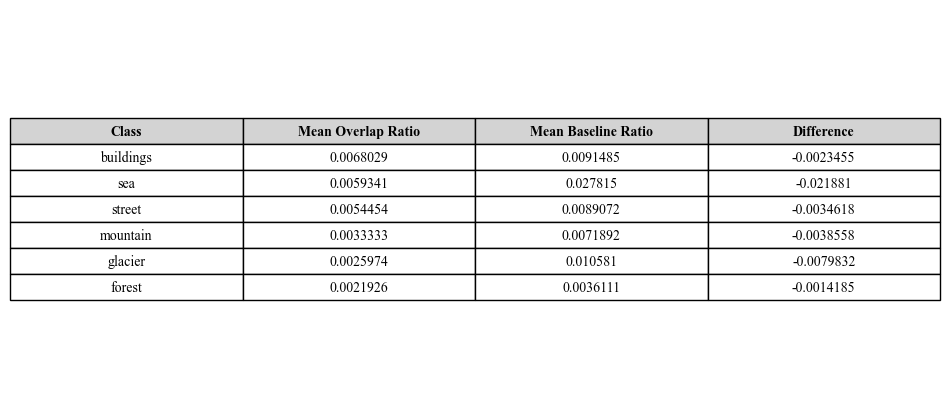

In [55]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Create DataFrame and format values
df = pd.DataFrame(results)
df = df.sort_values("Mean Overlap Ratio", ascending=False)

def format_val(val):
    try:
        val = float(val)
        s = f"{val:.5g}"
        if "e" in s or "E" in s:
            s = f"{val:.5f}"
        return s
    except:
        return str(val)

formatted_data = df.applymap(format_val).values.tolist()

# Create transparent figure
fig, ax = plt.subplots(figsize=(10, 4))
fig.patch.set_alpha(0)        # Transparent figure background
ax.set_facecolor("none")      # Transparent axes background
ax.axis('off')                # Hide axes

# Create and format table
table = ax.table(
    cellText=formatted_data,
    colLabels=df.columns,
    cellLoc='center',
    loc='center'
)
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)

# Style header and body
for (row, col), cell in table.get_celld().items():
    cell.set_edgecolor('black')
    if row == 0:
        cell.set_text_props(fontproperties={'weight': 'bold', 'family': 'Times New Roman'})
        cell.set_facecolor('#d3d3d3')
    else:
        cell.set_text_props(fontproperties={'family': 'Times New Roman'})
        cell.set_facecolor('white')  # Optional: for consistent cell coloring

# Tight layout, no title
plt.subplots_adjust(top=1.0, bottom=0.0)
plt.savefig("shap_topo_overlap_table.png", dpi=300, transparent=True, bbox_inches='tight')
plt.show()


C:\Users\VeryA\AppData\Local\Temp\ipykernel_8108\4206012948.py:20: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_data = df.applymap(format_val).values.tolist()


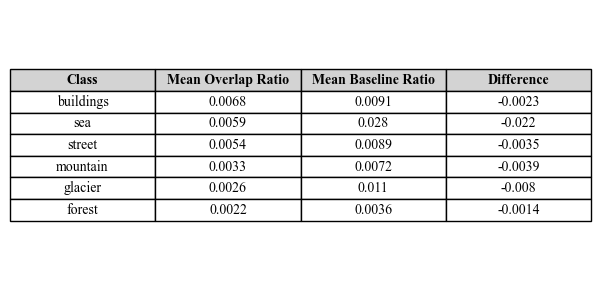

In [56]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Create DataFrame and sort
df = pd.DataFrame(results)
df = df.sort_values("Mean Overlap Ratio", ascending=False)

# Format: 2 significant figures, plain decimals
def format_val(val):
    try:
        val = float(val)
        s = f"{val:.2g}"
        if "e" in s or "E" in s:
            s = f"{val:.2f}"
        return s
    except:
        return str(val)

formatted_data = df.applymap(format_val).values.tolist()

# Tighter figure
fig, ax = plt.subplots(figsize=(7.5, 2.7))
fig.patch.set_alpha(0)         # Transparent background
ax.set_facecolor("none")
ax.axis('off')

# Create table
table = ax.table(
    cellText=formatted_data,
    colLabels=df.columns,
    cellLoc='center',
    loc='center'
)

# Style
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.0, 1.0)  # Tighter

for (row, col), cell in table.get_celld().items():
    cell.set_edgecolor('black')
    if row == 0:
        cell.set_text_props(fontproperties={'weight': 'bold', 'family': 'Times New Roman'})
        cell.set_facecolor('#d3d3d3')
    else:
        cell.set_text_props(fontproperties={'family': 'Times New Roman'})
        cell.set_facecolor('white')

plt.subplots_adjust(top=1.0, bottom=0.0)
plt.savefig("shap_topo_overlap_table.png", dpi=300, transparent=True, bbox_inches='tight')
plt.show()
